## Logistic Regression

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

#%matplotlib inline
#%matplotlib notebook
plt.rcParams["figure.figsize"] = (10,6)
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [2]:
df=pd.read_csv("diabetes.csv")

In [3]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.600,0.627,50,1
1,1,85,66,29,0,26.600,0.351,31,0
2,8,183,64,0,0,23.300,0.672,32,1
3,1,89,66,23,94,28.100,0.167,21,0
4,0,137,40,35,168,43.100,2.288,33,1


### Exploratory Data Analysis and Visualization

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.000,3.845,3.370,0.000,1.000,3.000,6.000,17.000
Glucose,768.000,120.895,31.973,0.000,99.000,117.000,140.250,199.000
BloodPressure,768.000,69.105,19.356,0.000,62.000,72.000,80.000,122.000
SkinThickness,768.000,20.536,15.952,0.000,0.000,23.000,32.000,99.000
Insulin,768.000,79.799,115.244,0.000,0.000,30.500,127.250,846.000
BMI,768.000,31.993,7.884,0.000,27.300,32.000,36.600,67.100
DiabetesPedigreeFunction,768.000,0.472,0.331,0.078,0.244,0.372,0.626,2.420
Age,768.000,33.241,11.760,21.000,24.000,29.000,41.000,81.000
Outcome,768.000,0.349,0.477,0.000,0.000,0.000,1.000,1.000


In [6]:
df.Outcome.value_counts()

0    500
1    268
Name: Outcome, dtype: int64

<AxesSubplot:xlabel='Pregnancies'>

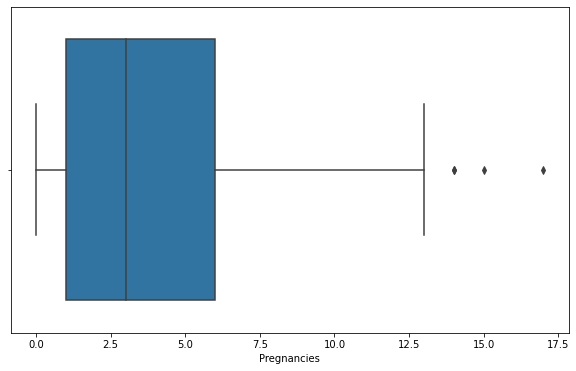

In [7]:
sns.boxplot(df.Pregnancies)

In [8]:
df=df[df.Pregnancies<13]

<AxesSubplot:xlabel='Pregnancies'>

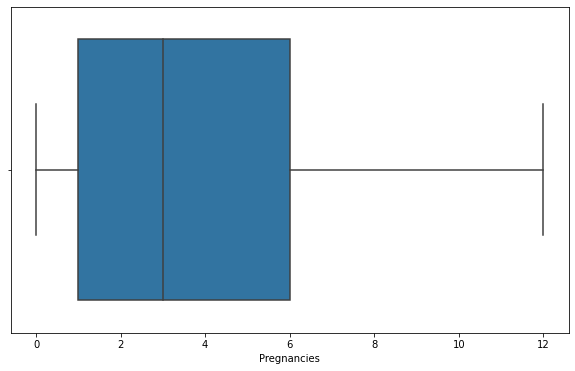

In [9]:
sns.boxplot(df.Pregnancies)

<AxesSubplot:xlabel='SkinThickness'>

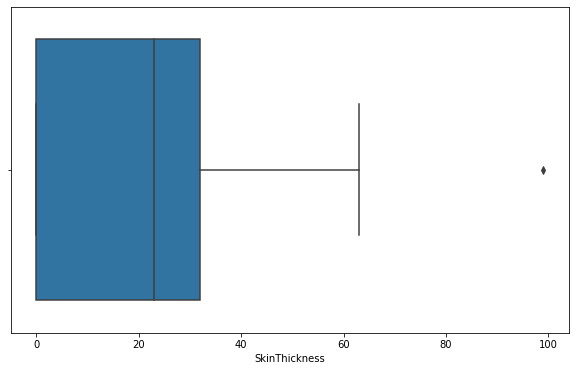

In [10]:
sns.boxplot(df.SkinThickness)

In [11]:
df=df[df.SkinThickness<70]

<AxesSubplot:xlabel='SkinThickness'>

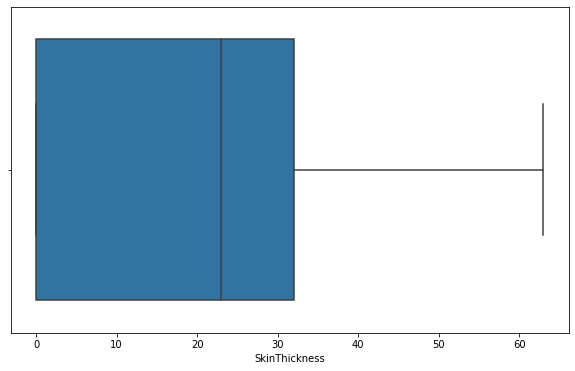

In [12]:
sns.boxplot(df.SkinThickness)

<AxesSubplot:xlabel='Insulin'>

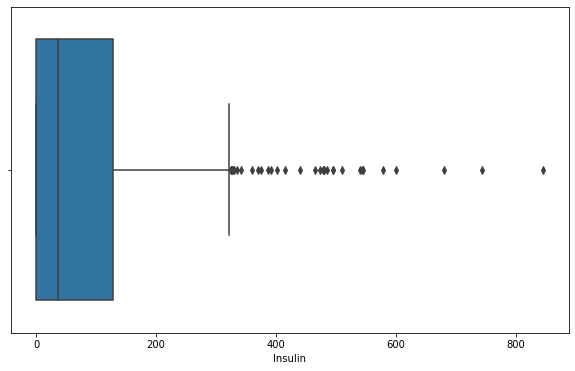

In [13]:
sns.boxplot(df.Insulin)

<AxesSubplot:xlabel='Glucose'>

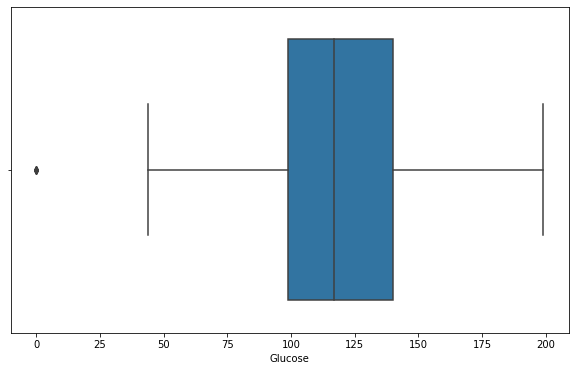

In [14]:
sns.boxplot(df.Glucose)

In [15]:
df=df[df.Glucose>0]

<AxesSubplot:xlabel='BloodPressure'>

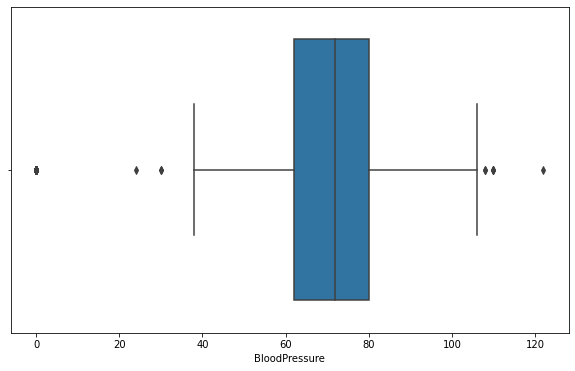

In [16]:
sns.boxplot(df.BloodPressure)

In [17]:
df=df[df.BloodPressure>35]

<AxesSubplot:xlabel='BloodPressure'>

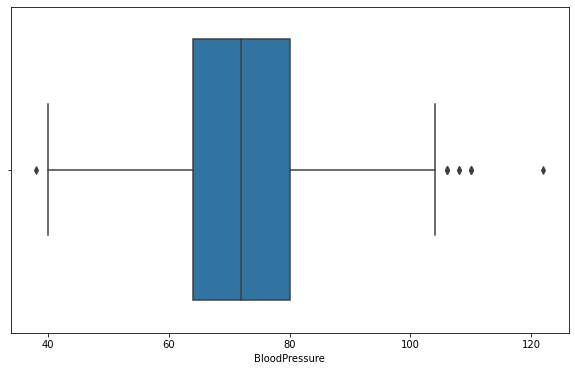

In [18]:
sns.boxplot(df.BloodPressure)

In [19]:
df.shape

(711, 9)

In [20]:
df.Outcome.value_counts()

0    471
1    240
Name: Outcome, dtype: int64

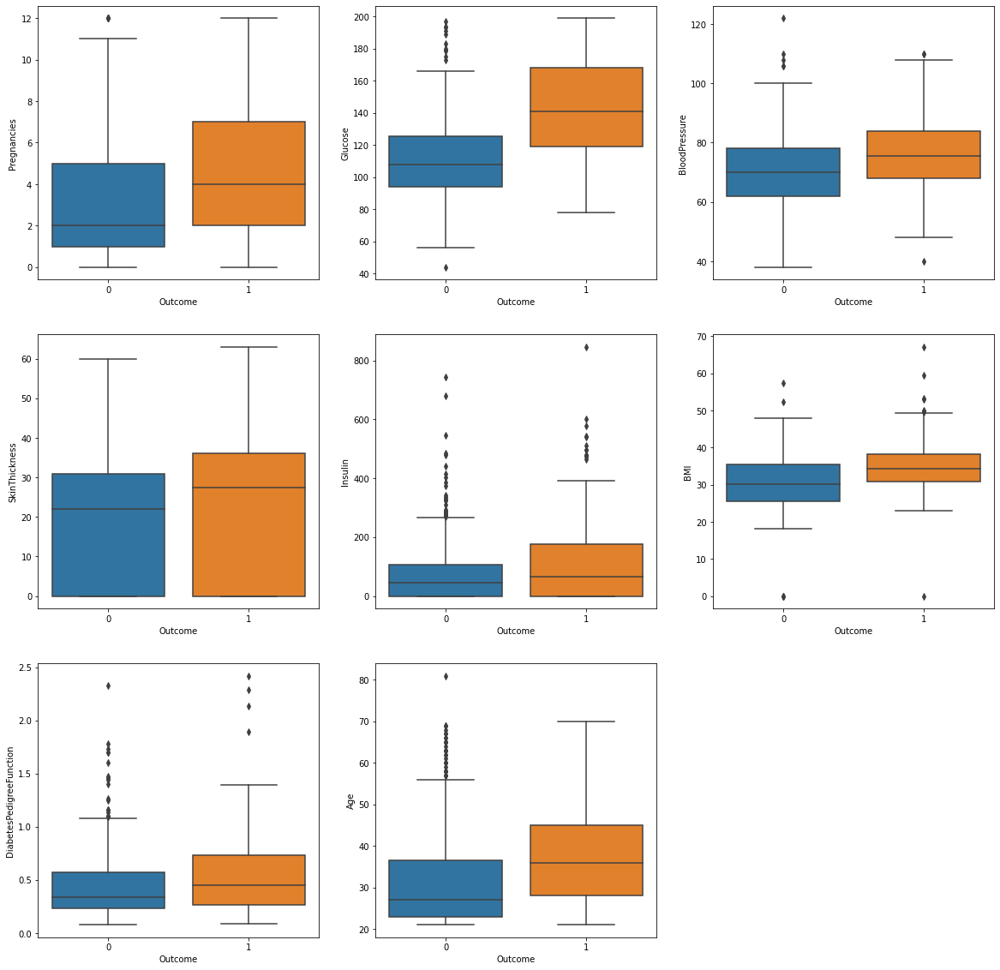

In [21]:
index = 0
plt.figure(figsize=(20,20))
for feature in df.columns:
    if feature != "Outcome":
        index += 1
        plt.subplot(3,3,index)
        sns.boxplot(x='Outcome',y=feature,data=df)

<AxesSubplot:>

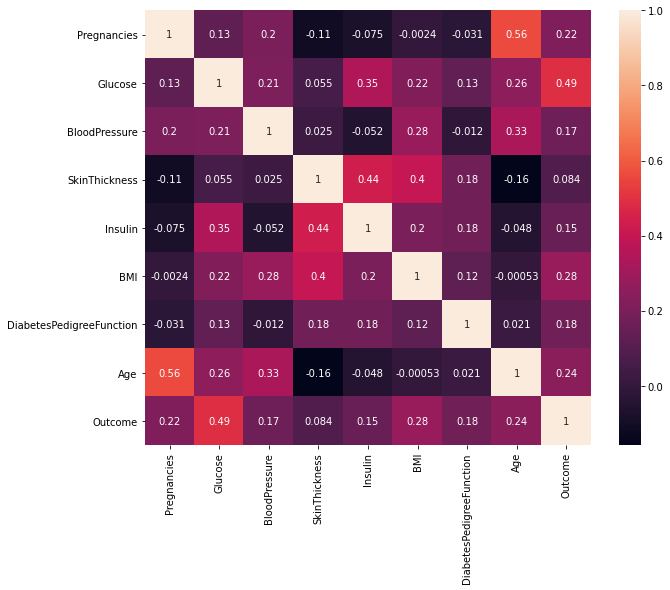

In [22]:
plt.figure(figsize=(10,8))
sns.heatmap(df.corr(), annot=True)

<AxesSubplot:>

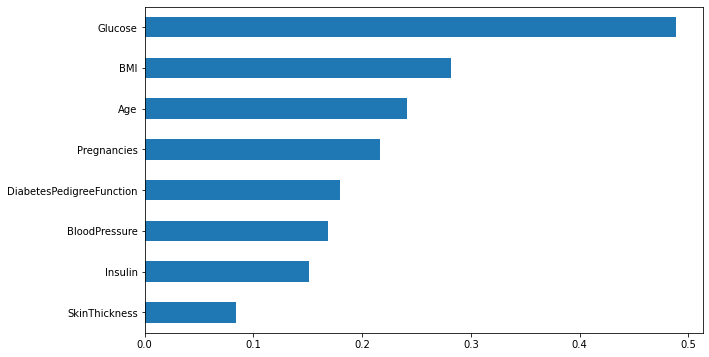

In [23]:
# df.corr()
# df.corr()["Outcome"].sort_values().plot.barh()
df.corr()["Outcome"].drop("Outcome").sort_values().plot.barh()

In [24]:
df.corr()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
Pregnancies,1.000,0.130,0.201,-0.105,-0.075,-0.002,-0.031,0.563,0.217
Glucose,0.130,1.000,0.212,0.055,0.346,0.219,0.131,0.256,0.489
BloodPressure,0.201,0.212,1.000,0.025,-0.052,0.284,-0.012,0.331,0.168
SkinThickness,-0.105,0.055,0.025,1.000,0.437,0.402,0.176,-0.159,0.084
Insulin,-0.075,0.346,-0.052,0.437,1.000,0.199,0.179,-0.048,0.151
BMI,-0.002,0.219,0.284,0.402,0.199,1.000,0.123,-0.001,0.282
DiabetesPedigreeFunction,-0.031,0.131,-0.012,0.176,0.179,0.123,1.000,0.021,0.180
Age,0.563,0.256,0.331,-0.159,-0.048,-0.001,0.021,1.000,0.241
Outcome,0.217,0.489,0.168,0.084,0.151,0.282,0.180,0.241,1.000


In [25]:
df.corr()["Outcome"].sort_values()

SkinThickness              0.084
Insulin                    0.151
BloodPressure              0.168
DiabetesPedigreeFunction   0.180
Pregnancies                0.217
Age                        0.241
BMI                        0.282
Glucose                    0.489
Outcome                    1.000
Name: Outcome, dtype: float64

<AxesSubplot:>

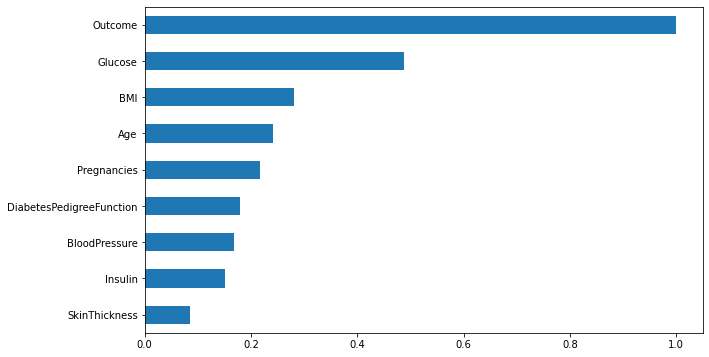

In [26]:
df.corr()["Outcome"].sort_values().plot.barh()

<AxesSubplot:>

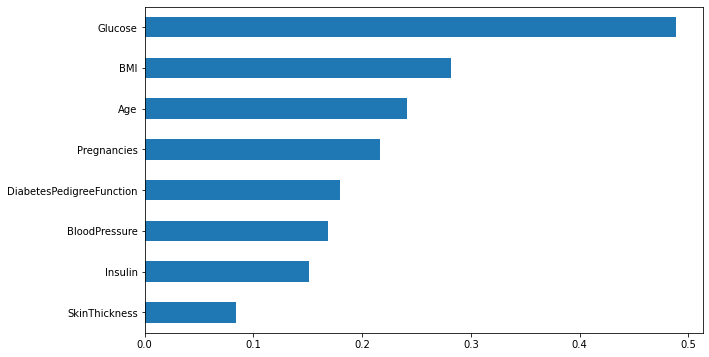

In [27]:
df.corr()["Outcome"].drop("Outcome").sort_values().plot.barh()

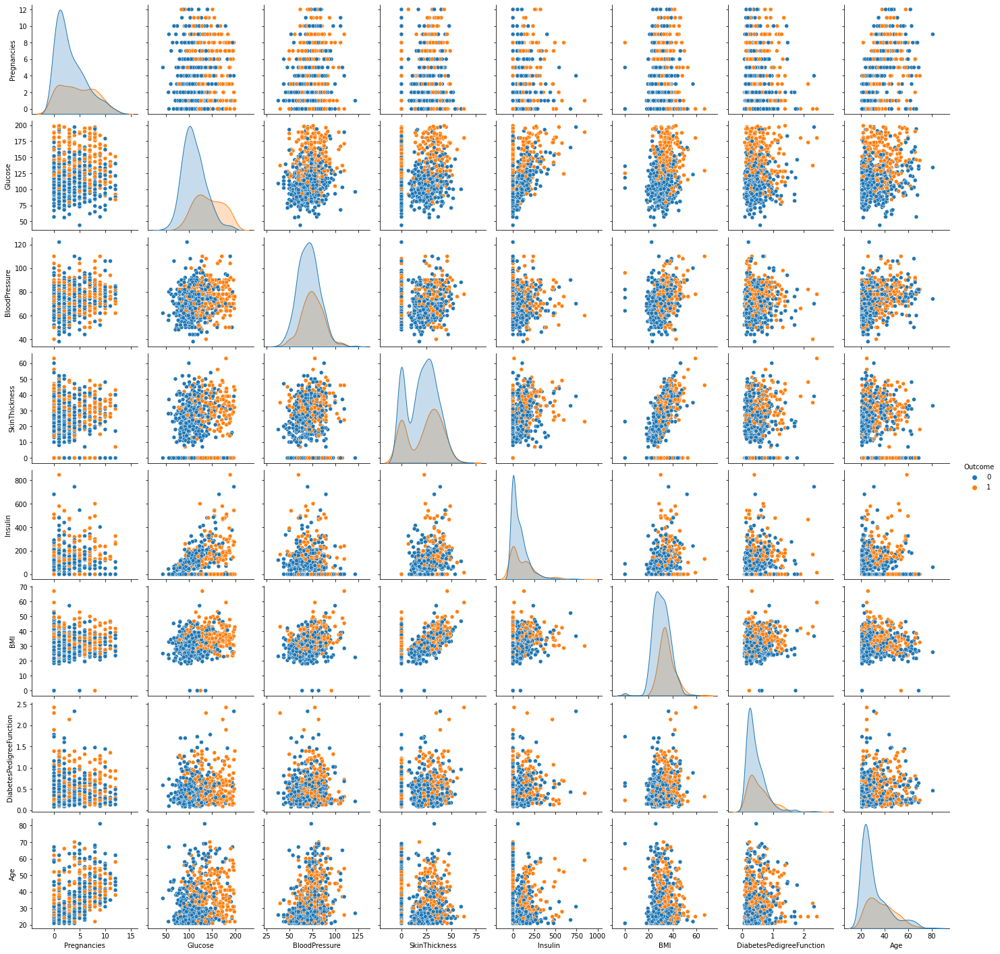

In [28]:
sns.pairplot(df, hue = "Outcome")

### Train | Test Split and Scaling

In [29]:
X=df.drop(["Outcome"], axis=1)
y=df["Outcome"]

In [30]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [31]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [32]:
scaler = StandardScaler()

In [33]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

### Modelling

In [34]:
from sklearn.linear_model import LogisticRegression

In [35]:
log_model = LogisticRegression()

In [36]:
log_model.fit(X_train_scaled, y_train)

LogisticRegression()

In [37]:
y_pred=log_model.predict(X_test_scaled)
y_pred_proba = log_model.predict_proba(X_test_scaled)

In [38]:
test_data = pd.concat([X_test, y_test], axis=1)
test_data["pred"] = y_pred
test_data["pred_proba"] = y_pred_proba[:,1]
test_data.sample(10)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,pred,pred_proba
474,4,114,64,0,0,28.900,0.126,24,0,0,0.139
608,0,152,82,39,272,41.500,0.270,27,0,1,0.559
2,8,183,64,0,0,23.300,0.672,32,1,1,0.765
56,7,187,68,39,304,37.700,0.254,41,1,1,0.893
66,0,109,88,30,0,32.500,0.855,38,1,0,0.212
640,0,102,86,17,105,29.300,0.695,27,0,0,0.113
698,4,127,88,11,155,34.500,0.598,28,0,0,0.404
144,4,154,62,31,284,32.800,0.237,23,0,0,0.488
286,5,155,84,44,545,38.700,0.619,34,0,1,0.765
439,6,107,88,0,0,36.800,0.727,31,0,0,0.364


### Model Performance on Classification Tasks

In [39]:
from sklearn.metrics import confusion_matrix, classification_report

In [40]:
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[105  15]
 [ 23  35]]
              precision    recall  f1-score   support

           0       0.82      0.88      0.85       120
           1       0.70      0.60      0.65        58

    accuracy                           0.79       178
   macro avg       0.76      0.74      0.75       178
weighted avg       0.78      0.79      0.78       178



### Cross Validate

In [41]:
from sklearn.model_selection import cross_validate

In [42]:
model = LogisticRegression()

In [43]:
scores = cross_validate(model, X_train_scaled, y_train, scoring = ['accuracy', 'precision_weighted','recall_weighted',
                                                                   'f1_weighted'], cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_accuracy             0.777
test_precision_weighted   0.779
test_recall_weighted      0.777
test_f1_weighted          0.768
dtype: float64

### ROC (Receiver Operating Curve) and AUC (Area Under Curve)

In [44]:
from sklearn.metrics import plot_precision_recall_curve, plot_roc_curve

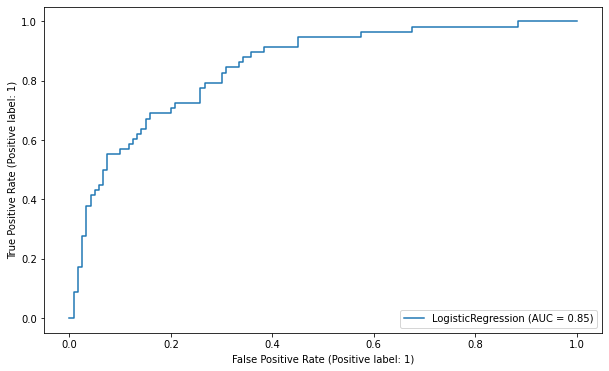

In [45]:
plot_roc_curve(log_model, X_test_scaled, y_test);

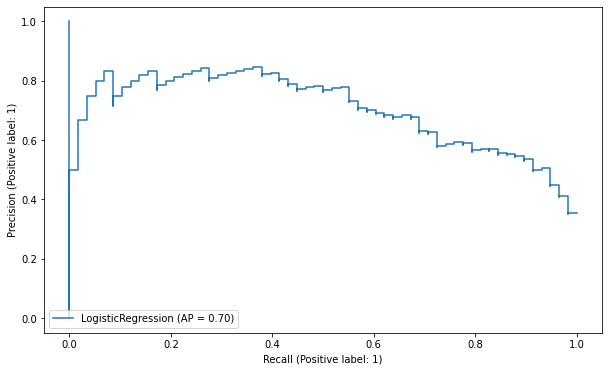

In [46]:
plot_precision_recall_curve(log_model, X_test_scaled, y_test);

### Final Model and Model Deployment

In [47]:
scaler = StandardScaler().fit(X)

In [48]:
import pickle
pickle.dump(scaler, open("diabetes_outcome", 'wb'))

In [49]:
X_scaled = scaler.transform(X)

In [50]:
final_model = LogisticRegression().fit(X_scaled, y)

In [51]:
pickle.dump(final_model, open("final_model_diabates", 'wb'))

In [52]:
X.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'],
      dtype='object')

In [53]:
X.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,711.000,3.699,3.123,0.000,1.000,3.000,6.000,12.000
Glucose,711.000,121.726,30.585,44.000,99.500,117.000,140.500,199.000
BloodPressure,711.000,72.519,12.020,38.000,64.000,72.000,80.000,122.000
SkinThickness,711.000,21.241,15.420,0.000,0.000,23.000,33.000,63.000
Insulin,711.000,84.907,117.738,0.000,0.000,48.000,132.000,846.000
BMI,711.000,32.190,7.245,0.000,27.400,32.000,36.500,67.100
DiabetesPedigreeFunction,711.000,0.477,0.336,0.078,0.245,0.380,0.634,2.420
Age,711.000,33.184,11.817,21.000,24.000,29.000,40.000,81.000


In [54]:
my_dict = {"Pregnancies": [3, 6],
           "Glucose": [117, 140],
           "BloodPressure": [72, 80],
           "SkinThickness": [23, 33],
           "Insulin": [48, 132],
           "BMI": [32, 36.5],
           "DiabetesPedigreeFunction": [0.38, 0.63],
           "Age": [29, 40]
          }

In [55]:
sample = pd.DataFrame(my_dict)
sample

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,3,117,72,23,48,32.000,0.380,29
1,6,140,80,33,132,36.500,0.630,40


In [57]:
scaler_diabates = pickle.load(open("diabetes_outcome", "rb"))

In [60]:
sample_scaled = scaler_diabates.transform(sample)
sample_scaled

array([[-0.22400409, -0.15462023, -0.04320561,  0.11418747, -0.31368981,
        -0.02624495, -0.28997302, -0.35434818],
       [ 0.73736556,  0.59791091,  0.62279303,  0.7631666 ,  0.40026203,
         0.59529996,  0.45428297,  0.57720042]])

In [58]:
final_model = pickle.load(open("final_model_diabates", "rb"))

In [61]:
predictions = final_model.predict(sample_scaled)
predictions_proba = final_model.predict_proba(sample_scaled)

In [62]:
sample["pred"] = predictions
sample["pred_proba"] = predictions_proba[:,1]
sample

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,pred,pred_proba
0,3,117,72,23,48,32.000,0.380,29,0,0.213
1,6,140,80,33,132,36.500,0.630,40,1,0.635
